In [5]:
from collections import defaultdict
import os
import argparse

import cv2
from matplotlib import pyplot as plt
import numpy as np

import utils


In [2]:

# cdir = os.path.dirname(os.path.realpath(__file__))

def get_files(src):
    """Get all files in a directory"""
    image_dir = os.path.join(src, "images")
    label_dir = os.path.join(src, "labels")
    images = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith((".jpg", ".jpeg", ".png"))]
    labels = [os.path.join(label_dir, f) for f in os.listdir(label_dir) if f.endswith(".txt")]

    if len(images) != len(labels):
        print("WARNING: Number of images and labels do not match. Removing extra files.")
        raise NotImplementedError("Alignment of images and labels not implemented yet.")
    return images, labels

In [3]:

def extract(imagepaths, labelpaths):
    """Preprocess images and labels"""
    res = defaultdict(list)
    for imgp, lblp in zip(imagepaths, labelpaths):
        polygons = utils.read_polygons(lblp)
        image = cv2.cvtColor(cv2.imread(imgp), cv2.COLOR_BGR2RGB)
        deals = utils.extract_polygons(image, polygons)
        res[imgp].extend(deals)
    return res


In [ ]:
def filter_large_contours(contours, image_shape, area_threshold=0.99):
    """Removes contours that cover nearly the whole image."""
    img_area = image_shape[0] * image_shape[1]
    filtered_contours_indices = [i for i, cnt in enumerate(contours) if cv2.contourArea(cnt) < area_threshold * img_area]
    filtered_contours = [cnt for cnt in contours if cv2.contourArea(cnt) < area_threshold * img_area]
    return filtered_contours, filtered_contours_indices

def refined_grabcut(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    mask = np.zeros(image.shape[:2], np.uint8)
    
    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)
    
    rect = (10, 10, image.shape[1] - 10, image.shape[0] - 10)
    cv2.grabCut(image, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)
    
    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
    foreground = image * mask2[:, :, np.newaxis]
    return foreground

def watershed_segmentation(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
    
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.5 * dist_transform.max(), 255, 0)
    
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)
    
    markers = cv2.connectedComponents(sure_fg)[1]
    markers += 1
    markers[unknown == 255] = 0
    
    markers = cv2.watershed(image, markers)
    image[markers == -1] = [255, 0, 0]


    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours,_ = filter_large_contours(contours, image.shape)
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)

    segmented = cv2.bitwise_and(image, image, mask=mask)
    return segmented
    

def edge_morphology_segmentation(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    plt.imshow(edges)
    plt.title("Edges")
    plt.show()

    kernel = np.ones((5, 5), np.uint8)
    dilated = cv2.dilate(edges, kernel, iterations=2)
    closed = cv2.morphologyEx(dilated, cv2.MORPH_CLOSE, kernel, iterations=2)
    
    contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    print(contours)
    for cnt in contours:
        x,y,w,h = cv2.boundingRect(cnt)
        cnt = image[y:y+h, x:x+w]
        plt.imshow(cnt)
        plt.show()

    mask = np.zeros_like(gray)
    cv2.drawContours(mask, contours, -1, (255), thickness=cv2.FILLED)
    plt.imshow(mask)
    plt.title("Mask Canny Contours")
    plt.show()
    segmented = cv2.bitwise_and(image, image, mask=mask)
    return segmented


def canny_convex_hull_segmentation(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    kernel = np.ones((5, 5), np.uint8)
    dilated = cv2.dilate(edges, kernel, iterations=2)
    closed = cv2.morphologyEx(dilated, cv2.MORPH_CLOSE, kernel, iterations=2)
    
    contours, _ = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours,_ = filter_large_contours(contours, image.shape)

    hulls = [cv2.convexHull(cnt) for cnt in contours]
    print(hulls)
    hull_mask = np.zeros_like(gray)
    cv2.drawContours(hull_mask, hulls, -1, (255), thickness=cv2.FILLED)

    segmented = cv2.bitwise_and(image, image, mask=hull_mask)
    return segmented

def hierarchical_contour_detection(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
    _, contours_indices = filter_large_contours(contours, image.shape)
    contours = [contours[i] for i in contours_indices]
    hierarchy = hierarchy[0][contours_indices]
    

    external_contours = np.zeros_like(gray)
    nested_contours = np.zeros_like(gray)

    for i, h in enumerate(hierarchy):
        if h[3] == -1:  # External contour
            cv2.drawContours(external_contours, contours, i, 255, thickness=cv2.FILLED)
        else:  # Nested contour
            cv2.drawContours(nested_contours, contours, i, 255, thickness=cv2.FILLED)

    external_segmented = cv2.bitwise_and(image, image, mask=external_contours)
    nested_segmented = cv2.bitwise_and(image, image, mask=nested_contours)
    
    return external_segmented, nested_segmented


In [ ]:
SRC = r"D:\OneDrives\OneDrive\Gabrilyi\leaflet_project\labeled\val_1_Gabriel_10102024"
imgps, lblps = get_files(SRC)
dealdict = extract(imgps, lblps)
for imgp, deals in dealdict.items():
    for deal in deals:
        foreground1 = refined_grabcut(deal)
        foreground2 = watershed_segmentation(deal)
        foreground3 = edge_morphology_segmentation(deal)
        foreground4 = canny_convex_hull_segmentation(deal)
        external, nested = hierarchical_contour_detection(deal)
        plt.figure(figsize=(12, 12))
        plt.subplot(331)
        plt.imshow(deal)
        plt.title("Original")
        plt.axis("off")
        plt.subplot(332)
        plt.imshow(foreground1)
        plt.title("Refined GrabCut")
        plt.axis("off")
        plt.subplot(333)
        plt.imshow(foreground2)
        plt.title("Watershed Segmentation")
        plt.axis("off")
        plt.subplot(334)
        plt.imshow(foreground3)
        plt.title("Edge Morphology Segmentation")
        plt.axis("off")
        plt.subplot(335)
        plt.imshow(foreground4)
        plt.title("Convex Hull Segmentation")
        plt.axis("off")
        plt.subplot(336)
        plt.imshow(external)
        plt.title("External Contours")
        plt.axis("off")
        plt.subplot(337)
        plt.imshow(nested)
        plt.title("Nested Contours")
        plt.axis("off")
        plt.show()
        break



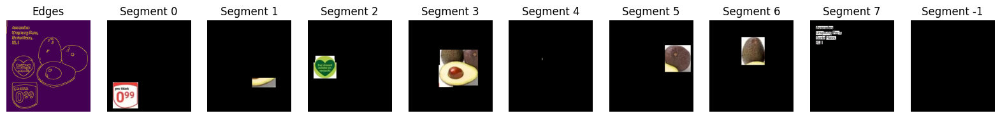

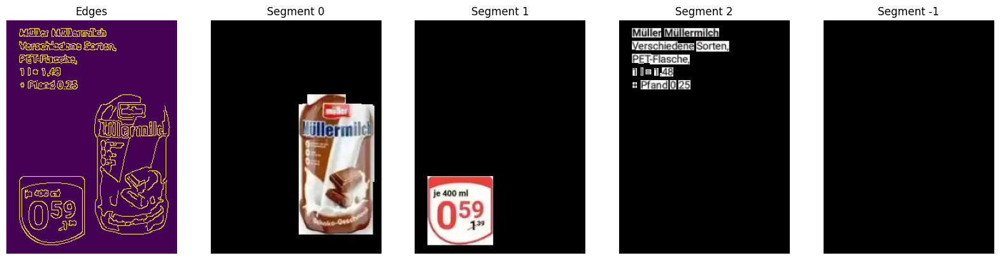

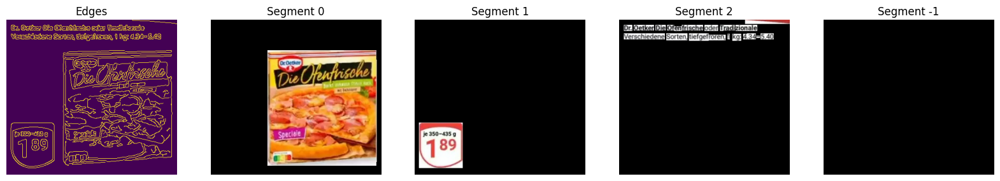

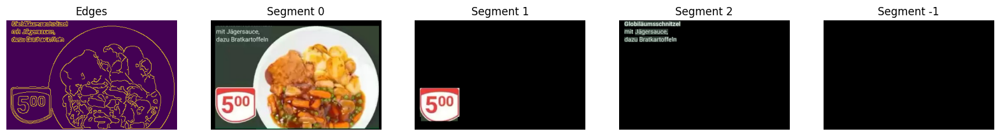

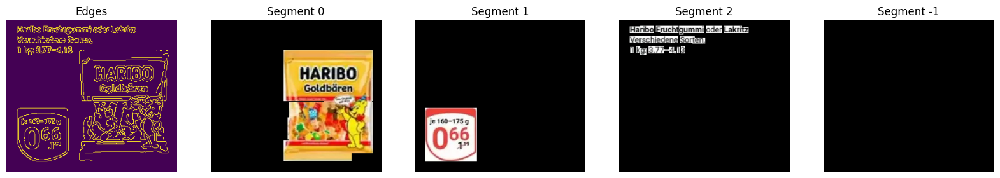

...

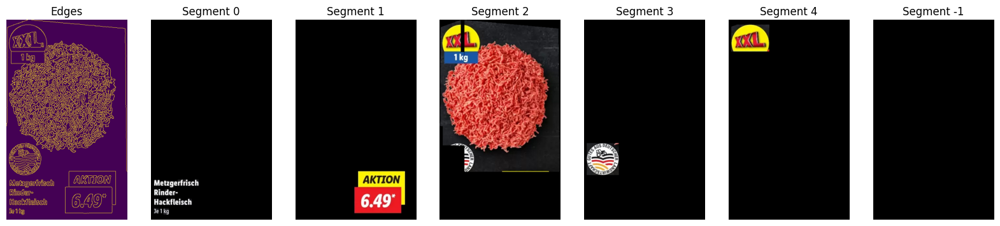

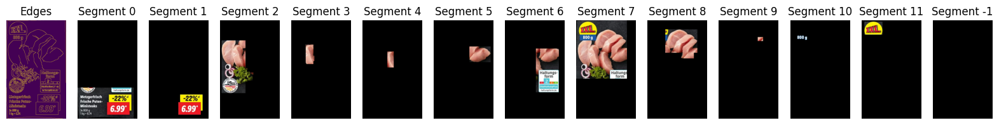

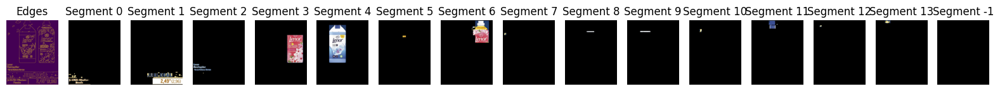

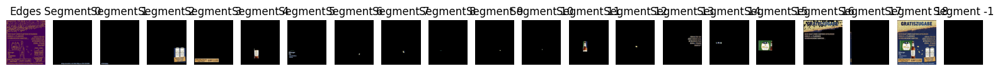

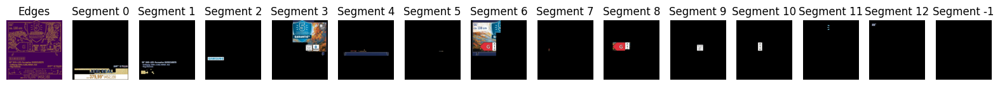

KeyboardInterrupt: 

In [15]:
import cv2
import numpy as np
from sklearn.cluster import DBSCAN

def preprocess_image(image):
    """Convert to grayscale and apply Canny edge detection."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blurred, 50, 150)
    return edges

def get_contours(edges):
    """Find and filter contours from the edge-detected image."""
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = [c for c in contours if cv2.contourArea(c)]  # Remove noise
    return contours

def spatial_clustering(contours):
    """Cluster contours based on their spatial positions."""
    bounding_boxes = [cv2.boundingRect(c) for c in contours]
    coords = np.array([(x + w // 2, y + h // 2) for x, y, w, h in bounding_boxes])

    clustering = DBSCAN(eps=40, min_samples=1).fit(coords)  # Adjust eps for better grouping
    labels = clustering.labels_

    clusters = {}
    for label, contour in zip(labels, contours):
        if label not in clusters:
            clusters[label] = []
        clusters[label].append(contour)
    
    # Add contours that were not clustered
    clusters[-1] = [contour for label, contour in zip(labels, contours) if label == -1]
    return clusters

def extract_segments(image, clusters):
    """Extract different segmented components."""
    segmented = {}
    for label, contours in clusters.items():
        mask = np.zeros(image.shape[:2], dtype=np.uint8)
        # cv2.drawContours(mask, contours, -1, 255, thickness=cv2.FILLED)
        # segmented[label] = cv2.bitwise_and(image, image, mask=mask)
        # Build bounding box around contours
        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)
            mask[y:y+h, x:x+w] = 255
        segmented[label] = cv2.bitwise_and(image, image, mask=mask)
    return segmented

SRC = r"D:\OneDrives\OneDrive\Gabrilyi\leaflet_project\labeled\val_1_Gabriel_10102024"
imgps, lblps = get_files(SRC)
dealdict = extract(imgps, lblps)
for imgp, deals in dealdict.items():
    for deal in deals:
        edges = preprocess_image(deal)
        contours = get_contours(edges)
        clusters = spatial_clustering(contours)
        segmented = extract_segments(deal, clusters)
        fig, axs = plt.subplots(1, len(segmented)+1, figsize=(20, 12))
        axs[0].imshow(edges)
        axs[0].set_title("Edges")
        axs[0].axis("off")
        for idx, (label, segment) in enumerate(segmented.items()):
            axs[idx+1].imshow(segment)
            axs[idx+1].set_title(f"Segment {label}")
            axs[idx+1].axis("off")
        plt.show()